# Testing and improving the spectrogram generating algorithm

In [1]:
import numpy as np
from matplotlib import pyplot as plt
from scipy.io.wavfile import write as wavwrite
from scipy.io.wavfile import read as wavread
from scipy.fft import fft,fftfreq,rfft,rfftfreq,irfft
import time
from IPython.display import Audio
import cv2 as cv



#default values 
duration = 1 #seconds
sample_rate = 44100 # samples per second
base = "D:/ENTC/PROJECTS/signal-processing/sp_files/"


#unique file name generator
def unique_file_name(additional_name=""):
    return str(time.time()) + ("_" + additional_name if additional_name else "") 




## The code snipet we can use!

In [2]:
sample_rate , data = wavread(base + "crazy-idea-track-part-01.wav")

#1664982039.3556576.wav  (100Hz+1000Hz sines)
# sample_rate , data = wavread(base + "1664982039.3556576.wav")


#data is a stereo signal --> convert to mono
data = np.average(data,axis=1)
#normalize
data = np.int16(data/np.abs(data).max()*32767)

print("sample rate:",sample_rate)
print("lenght",len(data))



# fig,ax = plt.subplots(1,figsize=(30,10))
# ax.plot(data)
# plt.show()

#-------------------------------------------------windowing -------------------------------------------

spacing = 0.005 # seconds
window_dura = 0.05 #seconds

signal_N = len(data) #length of whole audio

window_N = int(sample_rate * window_dura)
spacing_N = int(spacing * sample_rate)

#blackman nuttel window
a0,a1,a2,a3 = 0.3635819,0.4891775,0.1365995,0.0106411
xWindow = np.arange(0,window_N,1)
yWindow = a0 - a1 * np.cos(2 * np.pi * xWindow  / window_N) + a2 * np.cos(4 * np.pi * xWindow  / window_N) -a3 * np.cos(6 * np.pi * xWindow  / window_N)


n = int((signal_N - window_N) / spacing_N) # number of chunks targetable (window touches the starting point
                                                # ... total does not exceed signal length)
    
signal_chunks = []
for i in range(n):
    signal_chunks.append(data[i*spacing_N:i*spacing_N+window_N])
signal_chunks = np.array(signal_chunks)

windowed_chunks = yWindow * signal_chunks

#See how each windowed chunk looks like
# max_plot_N = 10
# fig,ax = plt.subplots(min(max_plot_N,n),1,figsize=(30,4*min(max_plot_N,n)))
# for i in range(n)[:max_plot_N]:
#     ax[i].plot(windowed_chunks[i])
# plt.show()
    
    
#-----------------------------------------------------Frequency domain of each chunk --------------------
#CALC and show the fourier transformation
FT_of_chunks = []
for i in range(len(windowed_chunks)):
    chunk = windowed_chunks[i]
    
    N = len(chunk) # number of samples in the time domain signal

    yf = rfft(chunk) #yf = FT_coef * N in that frequency (i.e. to get FT coef , devide by N)
    xf = rfftfreq(N,1/sample_rate) #N=number of samples in time domain, <2nd_arg> = time gap between 2 samples
    
    FT_of_chunks.append(np.abs(yf))
    
#     fig,ax = plt.subplots(2,figsize=(30,10))
#     ax[0].plot(chunk)
#     ax[1].stem(xf[:500],np.abs(yf/N)[:500])
#     plt.show()

    
FT_of_chunks = (np.array(FT_of_chunks)/len(chunk)).astype(np.uint8).T
FT_of_chunks = np.flip(FT_of_chunks,axis=0)

print("{} second spaced Number of chunks: ".format((spacing)) ,len(windowed_chunks))


equalized = cv.equalizeHist(FT_of_chunks)

fig,ax = plt.subplots(1,figsize=(90,5))
ax.imshow(equalized,cmap="jet")





FileNotFoundError: [Errno 2] No such file or directory: 'D:/ENTC/PROJECTS/signal-processing/sp_files/crazy-idea-track-part-01.wav'

## Seeing how window-parameters {spacing,window_dura} effect the spectrogram
Let's loop over some parameters and see results!

sample rate: 44100
lenght 711601
0.001 second spaced Number of chunks:  16172
0.001 second spaced Number of chunks:  16170
0.001 second spaced Number of chunks:  16167
0.001 second spaced Number of chunks:  16165
0.001 second spaced Number of chunks:  16162
0.005 second spaced Number of chunks:  3234
0.005 second spaced Number of chunks:  3231
0.005 second spaced Number of chunks:  3229
0.005 second spaced Number of chunks:  3227
0.005 second spaced Number of chunks:  3224
0.01 second spaced Number of chunks:  1613
0.01 second spaced Number of chunks:  1611
0.01 second spaced Number of chunks:  1608
0.01 second spaced Number of chunks:  1606
0.01 second spaced Number of chunks:  1603
0.02 second spaced Number of chunks:  806
0.02 second spaced Number of chunks:  804
0.02 second spaced Number of chunks:  801
0.02 second spaced Number of chunks:  799
0.02 second spaced Number of chunks:  796
0.03 second spaced Number of chunks:  537
0.03 second spaced Number of chunks:  535


C:\Users\R3KI3G\AppData\Local\Temp/ipykernel_18360/1662353869.py:83: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  fig,ax = plt.subplots(1,figsize=(90,5))


0.03 second spaced Number of chunks:  532
0.03 second spaced Number of chunks:  530
0.03 second spaced Number of chunks:  527
0.04 second spaced Number of chunks:  403
0.04 second spaced Number of chunks:  400
0.04 second spaced Number of chunks:  398
0.04 second spaced Number of chunks:  395
0.04 second spaced Number of chunks:  393
0.05 second spaced Number of chunks:  322
0.05 second spaced Number of chunks:  320
0.05 second spaced Number of chunks:  317
0.05 second spaced Number of chunks:  315
0.05 second spaced Number of chunks:  312
0.06 second spaced Number of chunks:  268
0.06 second spaced Number of chunks:  266
0.06 second spaced Number of chunks:  263
0.06 second spaced Number of chunks:  261
0.06 second spaced Number of chunks:  258
0.09 second spaced Number of chunks:  179
0.09 second spaced Number of chunks:  176
0.09 second spaced Number of chunks:  174
0.09 second spaced Number of chunks:  171
0.09 second spaced Number of chunks:  169
0.1 second spaced Number of chunks

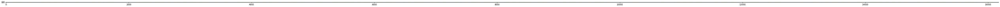

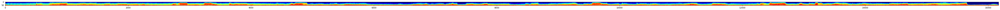

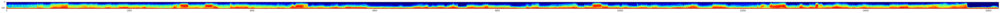

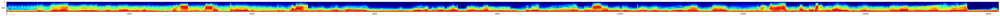

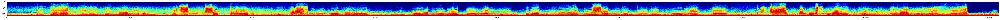

...

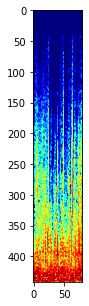

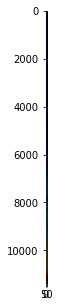

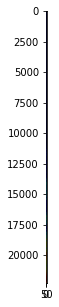

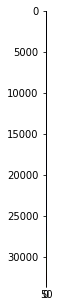

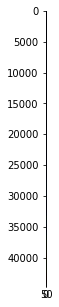

In [4]:
sample_rate , data = wavread(base + "crazy-idea-track-part-01.wav")

#1664982039.3556576.wav  (100Hz+1000Hz sines)
# sample_rate , data = wavread(base + "1664982039.3556576.wav")


#data is a stereo signal --> convert to mono
data = np.average(data,axis=1)
#normalize
data = np.int16(data/np.abs(data).max()*32767)

print("sample rate:",sample_rate)
print("lenght",len(data))



# fig,ax = plt.subplots(1,figsize=(30,10))
# ax.plot(data)
# plt.show()

#-------------------------------------------------windowing -------------------------------------------

spacing_test_values = [0.001,0.005,0.01,0.02,0.03,0.04,0.05,0.06,0.09,0.1,0.2]
for spacing in spacing_test_values:
    window_dura_test_values = [x for x in np.linspace(spacing*0.1,spacing*10,5)]
    for window_dura in window_dura_test_values:
        signal_N = len(data) #length of whole audio

        window_N = int(sample_rate * window_dura)
        spacing_N = int(spacing * sample_rate)

        #blackman nuttel window
        a0,a1,a2,a3 = 0.3635819,0.4891775,0.1365995,0.0106411
        xWindow = np.arange(0,window_N,1)
        yWindow = a0 - a1 * np.cos(2 * np.pi * xWindow  / window_N) + a2 * np.cos(4 * np.pi * xWindow  / window_N) -a3 * np.cos(6 * np.pi * xWindow  / window_N)


        n = int((signal_N - window_N) / spacing_N) # number of chunks targetable (window touches the starting point
                                                        # ... total does not exceed signal length)

        signal_chunks = []
        for i in range(n):
            signal_chunks.append(data[i*spacing_N:i*spacing_N+window_N])
        signal_chunks = np.array(signal_chunks)

        windowed_chunks = yWindow * signal_chunks

        #See how each windowed chunk looks like
        # max_plot_N = 10
        # fig,ax = plt.subplots(min(max_plot_N,n),1,figsize=(30,4*min(max_plot_N,n)))
        # for i in range(n)[:max_plot_N]:
        #     ax[i].plot(windowed_chunks[i])
        # plt.show()


        #-----------------------------------------------------Frequency domain of each chunk --------------------
        #CALC and show the fourier transformation
        FT_of_chunks = []
        for i in range(len(windowed_chunks)):
            chunk = windowed_chunks[i]

            N = len(chunk) # number of samples in the time domain signal

            yf = rfft(chunk) #yf = FT_coef * N in that frequency (i.e. to get FT coef , devide by N)
            xf = rfftfreq(N,1/sample_rate) #N=number of samples in time domain, <2nd_arg> = time gap between 2 samples

            FT_of_chunks.append(np.abs(yf))

        #     fig,ax = plt.subplots(2,figsize=(30,10))
        #     ax[0].plot(chunk)
        #     ax[1].stem(xf[:500],np.abs(yf/N)[:500])
        #     plt.show()


        FT_of_chunks = (np.array(FT_of_chunks)/len(chunk)).astype(np.uint8).T
        FT_of_chunks = np.flip(FT_of_chunks,axis=0)

        print("{} second spaced Number of chunks: ".format((spacing)) ,len(windowed_chunks))


        equalized = cv.equalizeHist(FT_of_chunks)

        fig,ax = plt.subplots(1,figsize=(90,5))
        ax.imshow(equalized,cmap="jet")





## Using different window lengths for different frequencies to see the effect

For a low frequency compornant, it would require a longer window. but for the low frequencies a small window wold be sufficient.\
Therefore let's use a window length inversly propotional to the frequency we are interested.

sample rate: 48000
lenght 960000
0.005 second spaced Number of chunks:  3960


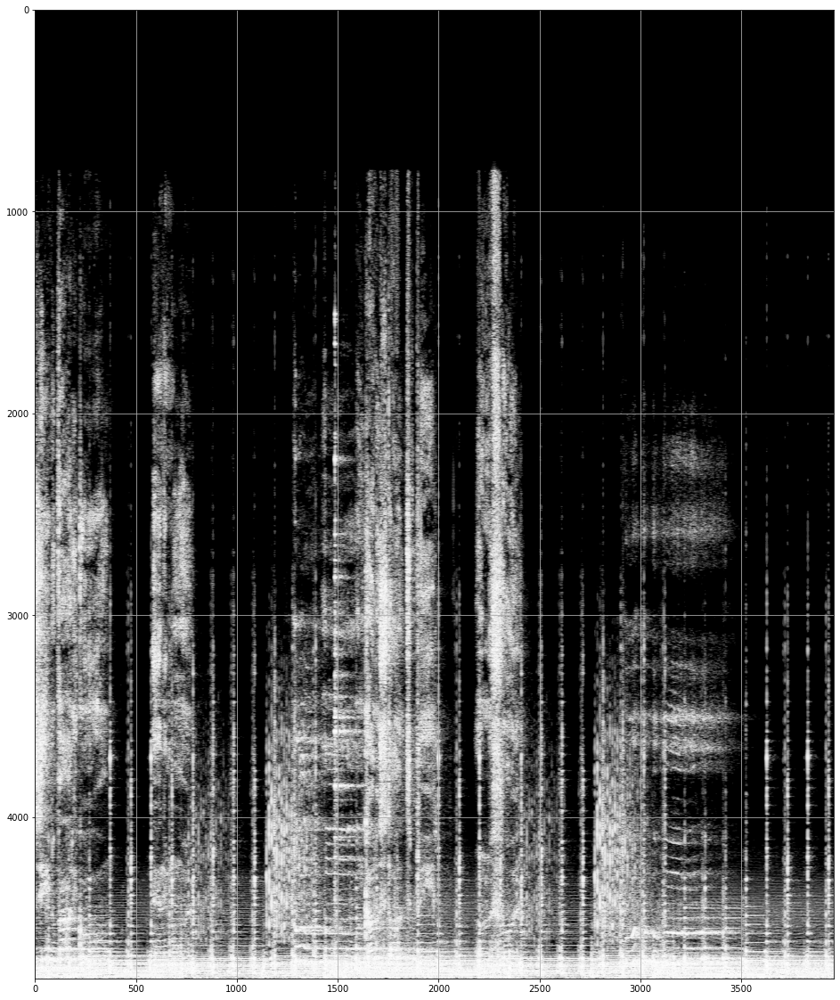

In [29]:
sample_rate , data = wavread(base + "flow-1.wav")

#1664982039.3556576.wav  (100Hz+1000Hz sines)
# sample_rate , data = wavread(base + "1664982039.3556576.wav")


#data is a stereo signal --> convert to mono
data = np.average(data,axis=1)
#normalize
data = np.int16(data/np.abs(data).max()*32767)


#selecting a shorter duration
# data = data[20*sample_rate:42*sample_rate]

print("sample rate:",sample_rate)
print("lenght",len(data))



# fig,ax = plt.subplots(1,figsize=(30,10))
# ax.plot(data)
# plt.show()

#-------------------------------------------------windowing -------------------------------------------

spacing = 0.005 # seconds
window_dura = 0.2 #seconds

signal_N = len(data) #length of whole audio

window_N = int(sample_rate * window_dura)
spacing_N = int(spacing * sample_rate)

#blackman nuttel window
a0,a1,a2,a3 = 0.3635819,0.4891775,0.1365995,0.0106411
xWindow = np.arange(0,window_N,1)
yWindow = a0 - a1 * np.cos(2 * np.pi * xWindow  / window_N) + a2 * np.cos(4 * np.pi * xWindow  / window_N) -a3 * np.cos(6 * np.pi * xWindow  / window_N)


n = int((signal_N - window_N) / spacing_N) # number of chunks targetable (window touches the starting point
                                                # ... total does not exceed signal length)
    
signal_chunks = []
for i in range(n):
    signal_chunks.append(data[i*spacing_N:i*spacing_N+window_N])
signal_chunks = np.array(signal_chunks)

windowed_chunks = yWindow * signal_chunks

#See how each windowed chunk looks like
# max_plot_N = 10
# fig,ax = plt.subplots(min(max_plot_N,n),1,figsize=(30,4*min(max_plot_N,n)))
# for i in range(n)[:max_plot_N]:
#     ax[i].plot(windowed_chunks[i])
# plt.show()
    
    
#-----------------------------------------------------Frequency domain of each chunk --------------------
#CALC and show the fourier transformation
FT_of_chunks = []
for i in range(len(windowed_chunks)):
    chunk = windowed_chunks[i]
    
    N = len(chunk) # number of samples in the time domain signal

    yf = rfft(chunk) #yf = FT_coef * N in that frequency (i.e. to get FT coef , devide by N)
    xf = rfftfreq(N,1/sample_rate) #N=number of samples in time domain, <2nd_arg> = time gap between 2 samples
    
    FT_of_chunks.append(np.abs(yf))
    
#     fig,ax = plt.subplots(2,figsize=(30,10))
#     ax[0].plot(chunk)
#     ax[1].stem(xf[:500],np.abs(yf/N)[:500])
#     plt.show()

    
FT_of_chunks = (np.array(FT_of_chunks)/len(chunk)).astype(np.uint8).T
FT_of_chunks = np.flip(FT_of_chunks,axis=0)

print("{} second spaced Number of chunks: ".format((spacing)) ,len(windowed_chunks))


equalized = cv.equalizeHist(FT_of_chunks)

fig,ax = plt.subplots(1,figsize=(90,20))
ax.imshow(equalized,cmap="gray")
plt.grid()
plt.show()




In [21]:
start_time,end_time = 0,100
interested_data = data

filepath = base + "temp/" + unique_file_name() + ".wav"
wavwrite(filepath,sample_rate,interested_data)
Audio(filepath, autoplay=True)

In [14]:
print(len(data)//sample_rate)

20
